## Logistic Regression for Predicting Loan Defaults

This code uses a logistic regression to train a model to predict the probability of loan defaults.


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import StandardScaler
import requests
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns


x = requests.get("https://raw.githubusercontent.com/rety03/EconModellingProject/main/loan_data.csv")
with open("loan_data.csv", "w") as f:
  f.write(x.text)

loans = pd.read_csv('loan_data.csv')

loans['Age'].fillna(loans['Age'].mean(), inplace=True)
loans['Income'].fillna(loans['Income'].mean(), inplace=True)
loans['LoanAmount'].fillna(loans['LoanAmount'].mean(), inplace=True)
loans['CreditScore'].fillna(loans['CreditScore'].mean(), inplace=True)
loans['MonthsEmployed'].fillna(loans['MonthsEmployed'].mean(), inplace=True)
loans['InterestRate'].fillna(loans['InterestRate'].mean(), inplace=True)
loans['LoanTerm'].fillna(loans['LoanTerm'].mean(), inplace=True)
loans['MaritalStatus'].fillna(loans['MaritalStatus'].mode()[0], inplace=True)
loans['HasMortgage'].fillna(loans['HasMortgage'].mode()[0], inplace=True)
loans['EmploymentType'].fillna(loans['EmploymentType'].mode()[0], inplace=True)
loans['LoanPurpose'].fillna(loans['LoanPurpose'].mode()[0], inplace=True)
loans['HasDependents'].fillna(loans['HasDependents'].mode()[0], inplace=True)
loans['HasCoSigner'].fillna(loans['HasCoSigner'].mode()[0], inplace=True)
loans['Education'].fillna(loans['Education'].mode()[0], inplace=True)
loans['DTIRatio'].fillna(loans['DTIRatio'].mode()[0], inplace=True)
loans['NumCreditLines'].fillna(loans['NumCreditLines'].mode()[0], inplace=True)

# Encode categorical variables
# Setting drop_first equal to true to avoid multicolinearity
loans = pd.get_dummies(loans, columns=['MaritalStatus', 'HasMortgage','LoanPurpose','EmploymentType', 'Education', 'HasDependents', 'HasCoSigner'], drop_first=True)

# Drop unnecessary columns
loans.drop(['LoanID'], axis=1, inplace=True)

# Feature scaling
scaler = StandardScaler()
loans[['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed', 'InterestRate', 'LoanTerm', 'DTIRatio', 'NumCreditLines']] = scaler.fit_transform(loans[['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed','InterestRate', 'LoanTerm', 'DTIRatio','NumCreditLines']])

# Separate features (X) and target variable (y)
X = loans.drop('Default', axis=1)
y = loans['Default']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Instantiate and train the logistic regression model
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = log_reg.predict(X_test)

# Evaluate the model performance
cm = confusion_matrix(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

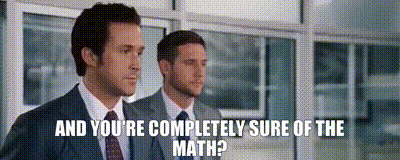

## Outputs from training the model

We plotted the confusion matrix and calculated the accuracy, precision, recall and F1 Score of the logistic regression model in order to evaluate its accuracy.

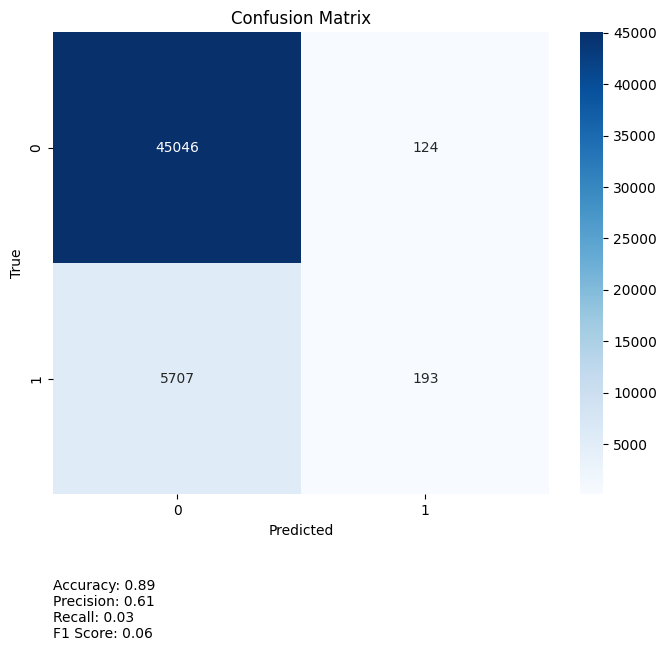

In [ ]:
# Print the evaluation metrics
# Plotting confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.text(0, -0.25, f"Accuracy: {accuracy:.2f}\nPrecision: {precision:.2f}\nRecall: {recall:.2f}\nF1 Score: {f1:.2f}",
         ha='left', va='center', transform=plt.gca().transAxes)
plt.show()

We observe a lot of false negatives, to improve this in the future we can train it on a larger dataset or try using a diffirent type of machine learning model.

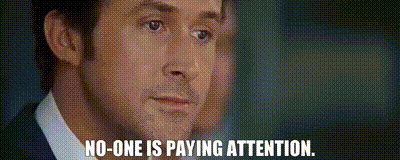

## Input User Data

Here, we though it be interesting to make it possible to input any parameters to see how likely any given individual is to default on their loan

In [ ]:
#User inputs
Age = 23 # @param {type:"slider", min:0, max:100, step:1}
Income = 96000 # @param {type:"slider", min:0, max:500000, step:100}
LoanAmount = 150000 # @param {type:"slider", min:5000, max:250000, step:100}
CreditScore = 800 # @param {type:"slider", min:300, max:850, step:5}
MonthsEmployed = 120 # @param {type:"slider", min:0, max:120, step:1}
InterestRate = 5 # @param {type:"slider", min:0, max:120, step:1}
LoanTerm = 36 # @param {type:"slider", min:12, max:120, step:1}
DTIRatio = 0 # @param {type:"slider", min:0, max:1, step:0.01}
NumCreditLines = "3" #  @param ["1", "2", "3", "4"]
MaritalStatus = "Married" # @param ["Married", "Divorced", "Single"]
HasMortgage = "No" # @param ["Yes", "No"]
EmploymentType = "Full-time" # @param ["Full-time", "Part-time", "Self-employed", "Unemployed"]
LoanPurpose = "Business" # @param ["Home", "Education", "Auto", "Business", "Other"]
Education = "Bachelor's" # @param ["High School", "Bachelor's", "Master's", "PhD"]
HasDependents = "Yes" # @param ["Yes", "No"]
HasCoSigner = "Yes" # @param ["Yes", "No"]

In [ ]:
user_data = {
    "Age": [Age],
    "Income": [Income],
    "LoanAmount": [LoanAmount],
    "CreditScore": [CreditScore],
    "MonthsEmployed": [MonthsEmployed],
    "InterestRate": [InterestRate],
    "LoanTerm": [LoanTerm],
    "DTIRatio": [DTIRatio],
    "NumCreditLines": [NumCreditLines],
    "MaritalStatus": [MaritalStatus],
    "HasMortgage": [HasMortgage],
    "LoanPurpose": [LoanPurpose],
    "EmploymentType": [EmploymentType],
    "Education": [Education],
    "HasDependents": [HasDependents],
    "HasCoSigner": [HasCoSigner],
}


user_df = pd.DataFrame(user_data)

user_df[['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed', 'InterestRate', 'LoanTerm', 'DTIRatio', 'NumCreditLines']] = scaler.transform(
    user_df[['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed','InterestRate', 'LoanTerm', 'DTIRatio','NumCreditLines']])

user_df = pd.get_dummies(user_df, columns=['MaritalStatus', 'HasMortgage','LoanPurpose','EmploymentType', 'Education', 'HasDependents', 'HasCoSigner'], drop_first=True)

# Ensure column alignment with training data
user_df = user_df.reindex(columns=X_train.columns, fill_value=0)

# Predict the probability of loan default for the user
probability_of_default = log_reg.predict_proba(user_df)[:, 1]

# Set a threshold (0.5 is common, but you can adjust it as needed)
threshold = 0.5

# Classify the probability into discrete classes
predicted_class = 1 if probability_of_default >= threshold else 0

print("Probability of loan default:", probability_of_default)
print("Predicted class:", predicted_class)




Probability of loan default: [0.10852442]
Predicted class: 0


# Heat Map

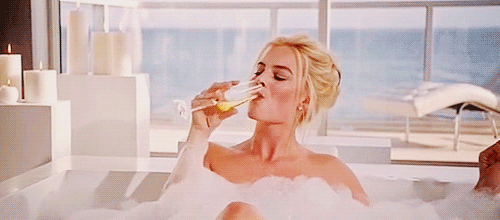

The code bellow generates a Heatmap, allowing us to see the correlation between the different variables the model.

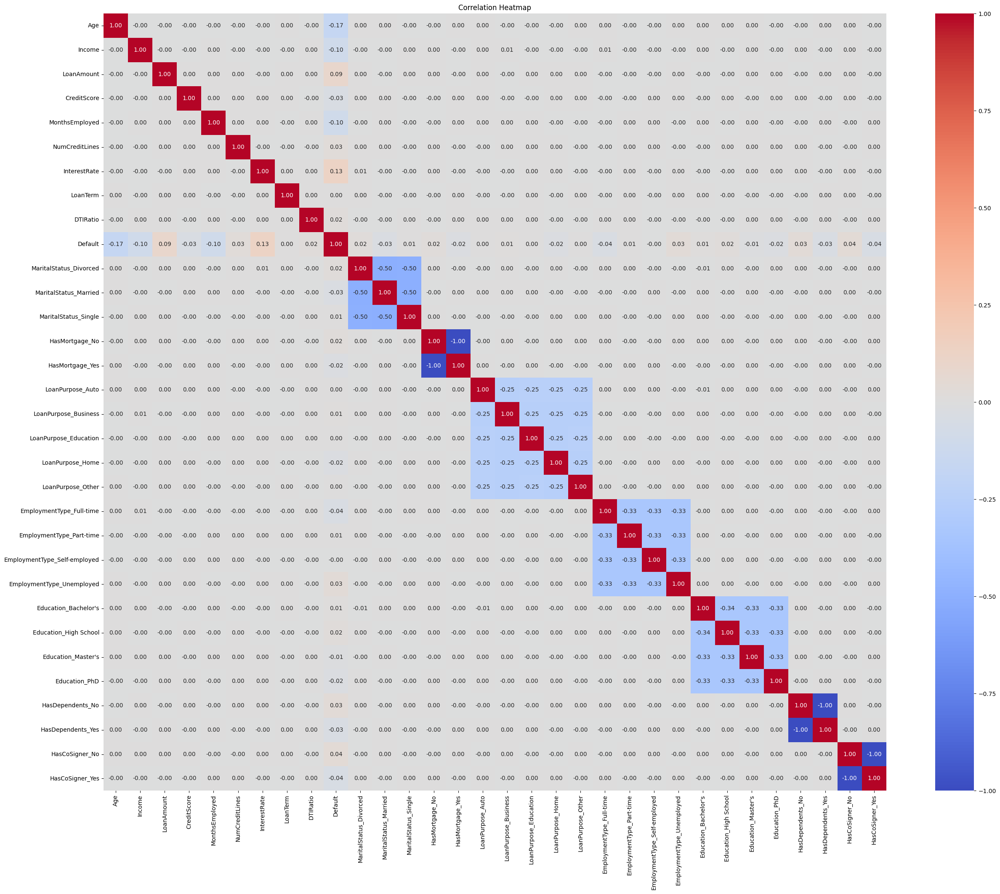

In [ ]:
# Importing necessary libraries for visualization
import seaborn as sns
from sklearn.metrics import confusion_matrix

x = requests.get("https://raw.githubusercontent.com/rety03/EconModellingProject/main/loan_data.csv")
with open("loan_data.csv", "w") as f:
  f.write(x.text)

loans1 = pd.read_csv('loan_data.csv')

# Encode categorical variables
# Setting drop_first equal to false to show all the variables, even though the multincolinearity can be seen in the heat map
loans1 = pd.get_dummies(loans1, columns=['MaritalStatus', 'HasMortgage','LoanPurpose','EmploymentType', 'Education', 'HasDependents', 'HasCoSigner'], drop_first=False)

# Drop unnecessary columns
loans1.drop(['LoanID'], axis=1, inplace=True)

# Feature scaling
scaler = StandardScaler()
loans1[['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed', 'InterestRate', 'LoanTerm', 'DTIRatio', 'NumCreditLines']] = scaler.fit_transform(loans1[['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed','InterestRate', 'LoanTerm', 'DTIRatio','NumCreditLines']])


# Plotting correlation heatmap
plt.figure(figsize=(30, 24))
sns.heatmap(loans1.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()


# Graphics

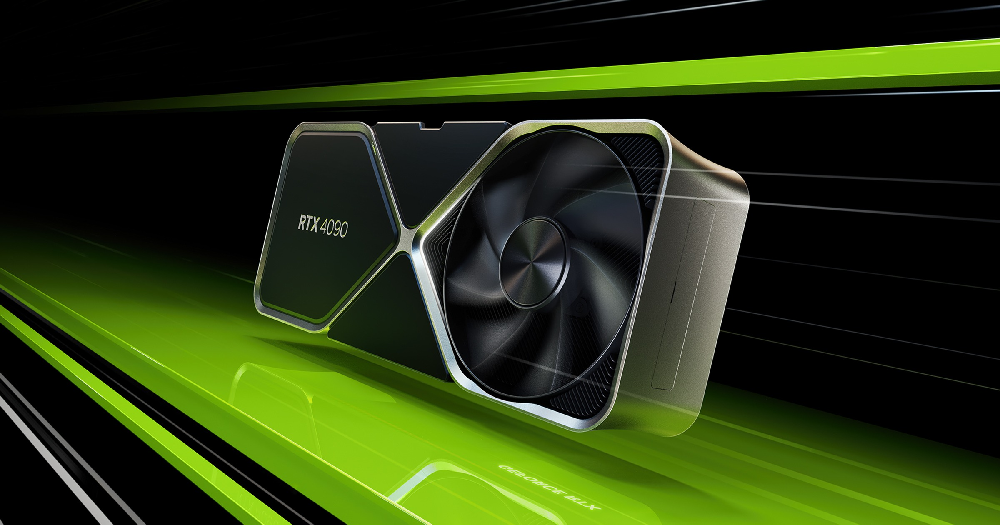

### Scatter Plots

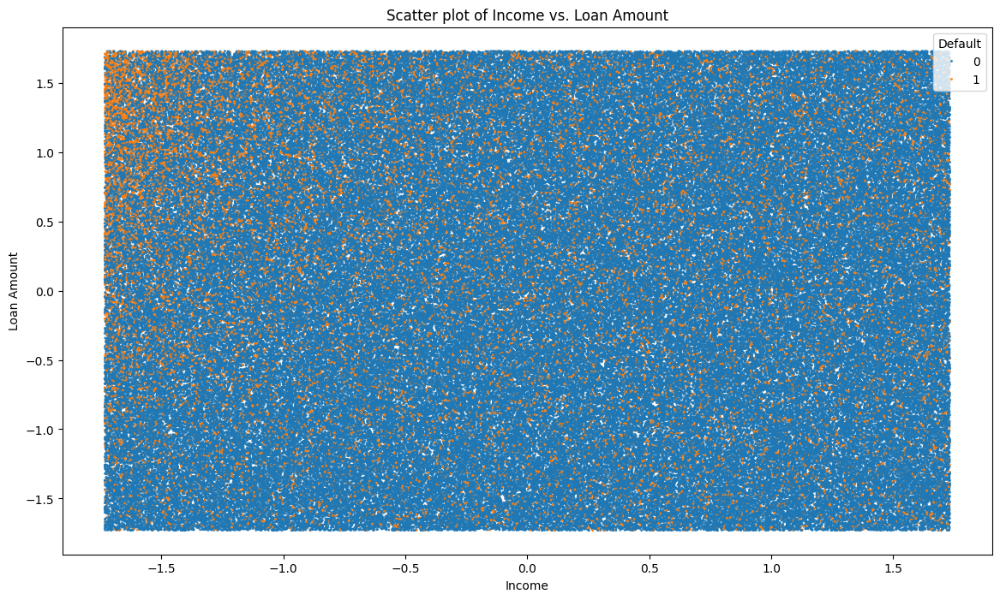

In [ ]:
# Scatter plot between Income and LoanAmount
plt.figure(figsize=(14, 8))
sns.scatterplot(data=loans1, x='Income', y='LoanAmount', hue='Default', edgecolor='none', s=4.5, alpha=0.9)
plt.title('Scatter plot of Income vs. Loan Amount')
plt.xlabel('Income')
plt.ylabel('Loan Amount')
plt.legend(title='Default', loc='upper right')
plt.show()

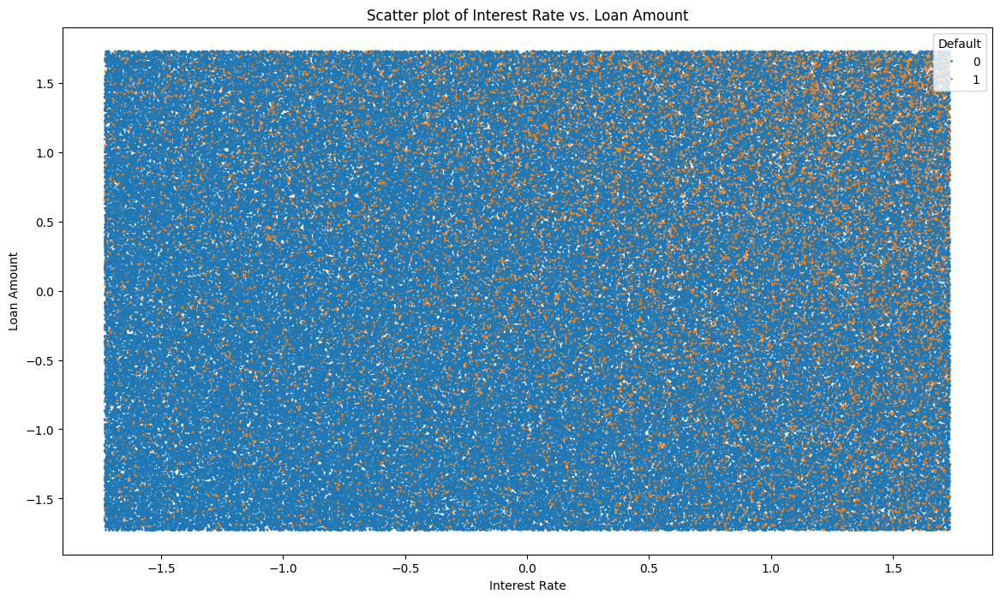

In [ ]:
# Scatter plot between InterestRate and LoanAmount
plt.figure(figsize=(14, 8))
sns.scatterplot(data=loans1, x='InterestRate', y='LoanAmount', hue='Default', edgecolor='none', s=4.5, alpha=0.9)
plt.title('Scatter plot of Interest Rate vs. Loan Amount')
plt.xlabel('Interest Rate')
plt.ylabel('Loan Amount')
plt.legend(title='Default', loc='upper right')
plt.show()

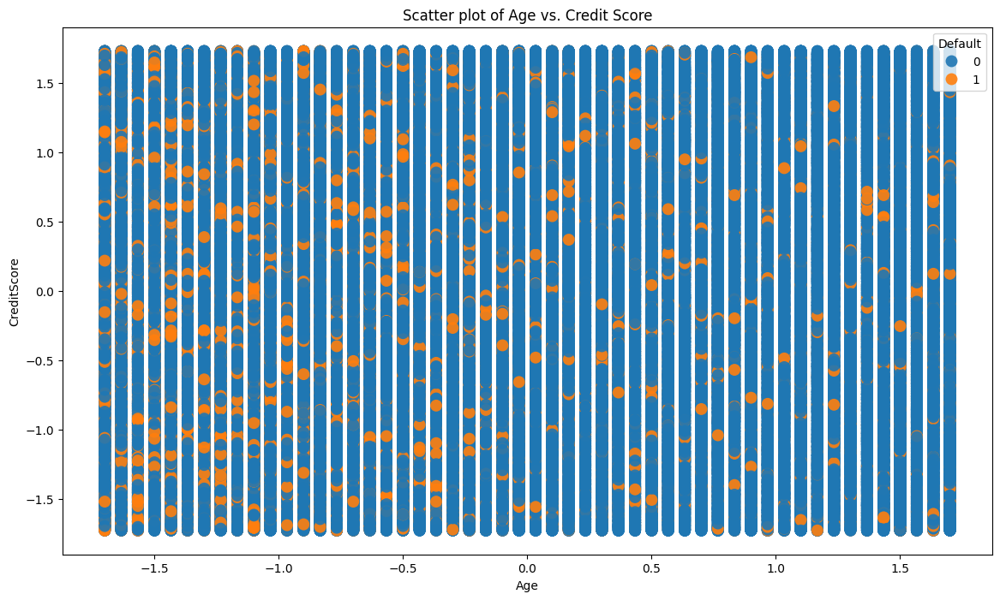

In [ ]:
# Scatter plot between Age and CreditScore
plt.figure(figsize=(14, 8))
sns.scatterplot(data=loans1, x='Age', y='CreditScore', hue='Default', edgecolor='none', s=100, alpha=0.9)
plt.title('Scatter plot of Age vs. Credit Score')
plt.xlabel('Age')
plt.ylabel('CreditScore')
plt.legend(title='Default', loc='upper right')
plt.show()

### Bar Charts

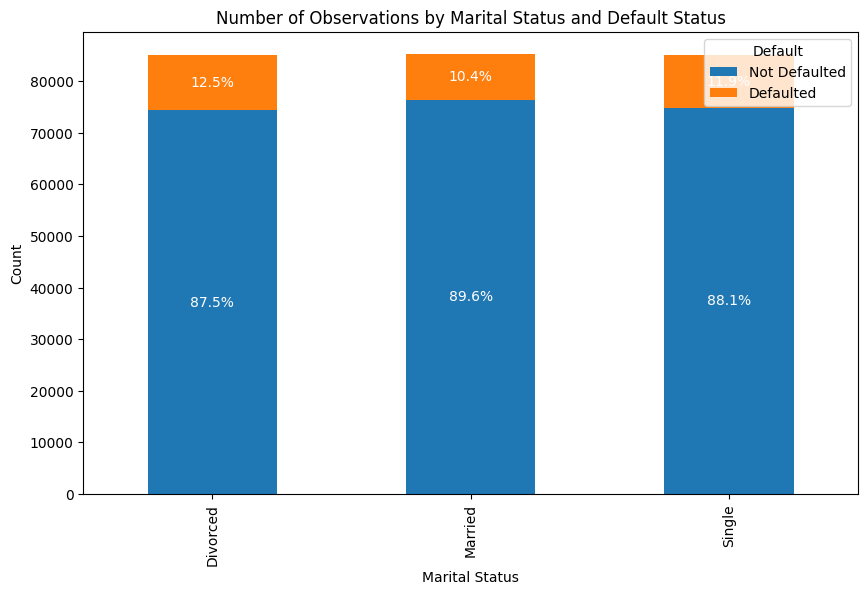

In [ ]:
x = requests.get("https://raw.githubusercontent.com/rety03/EconModellingProject/main/loan_data.csv")
with open("loan_data.csv", "w") as f:
  f.write(x.text)

loans2 = pd.read_csv('loan_data.csv')

counts = loans2.groupby(['MaritalStatus', 'Default']).size().unstack(fill_value=0)
percentages = counts.div(counts.sum(axis=1), axis=0) * 100
fig, ax = plt.subplots(figsize=(10, 6))
counts.plot(kind='bar', stacked=True, ax=ax, color=['#1f77b4', '#ff7f0e'])

for idx, (marital_status, row) in enumerate(counts.iterrows()):
    cumulative_count = 0
    for default_status in row.index:
        count = row[default_status]
        percentage = percentages.loc[marital_status, default_status]
        ax.text(idx, cumulative_count + count / 2, f'{percentage:.1f}%', ha='center', va='center', color='white', fontsize=10)
        cumulative_count += count

plt.title('Number of Observations by Marital Status and Default Status')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.legend(title='Default', labels=['Not Defaulted', 'Defaulted'], loc='upper right')
plt.show()

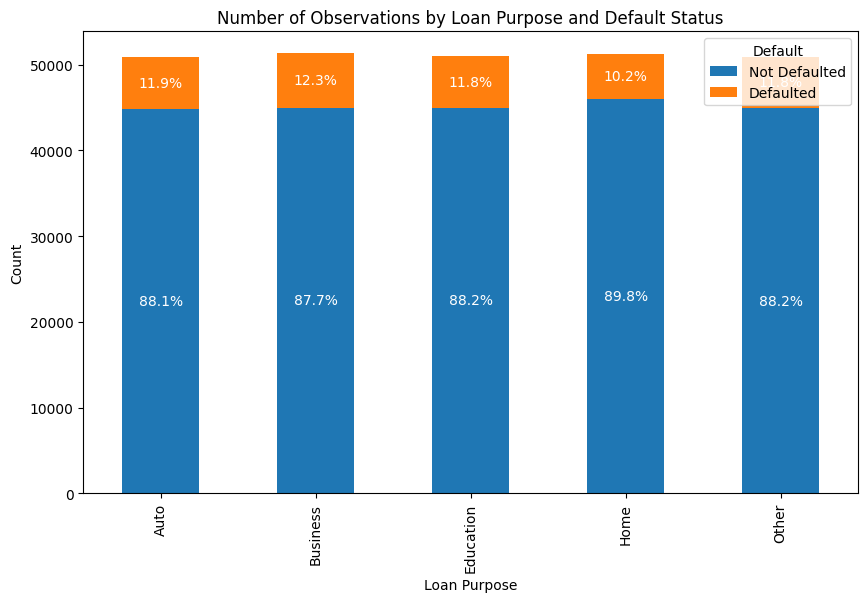

In [ ]:
counts2 = loans2.groupby(['LoanPurpose', 'Default']).size().unstack(fill_value=0)
percentages2 = counts2.div(counts2.sum(axis=1), axis=0) * 100
fig, ax = plt.subplots(figsize=(10, 6))
counts2.plot(kind='bar', stacked=True, ax=ax, color=['#1f77b4', '#ff7f0e'])

for idx, (loan_purpose, row) in enumerate(counts2.iterrows()):
    cumulative_count = 0
    for default_status in row.index:
        count = row[default_status]
        percentage = percentages2.loc[loan_purpose, default_status]
        ax.text(idx, cumulative_count + count / 2, f'{percentage:.1f}%', ha='center', va='center', color='white', fontsize=10)
        cumulative_count += count

plt.title('Number of Observations by Loan Purpose and Default Status')
plt.xlabel('Loan Purpose')
plt.ylabel('Count')
plt.legend(title='Default', labels=['Not Defaulted', 'Defaulted'], loc='upper right')
plt.show()

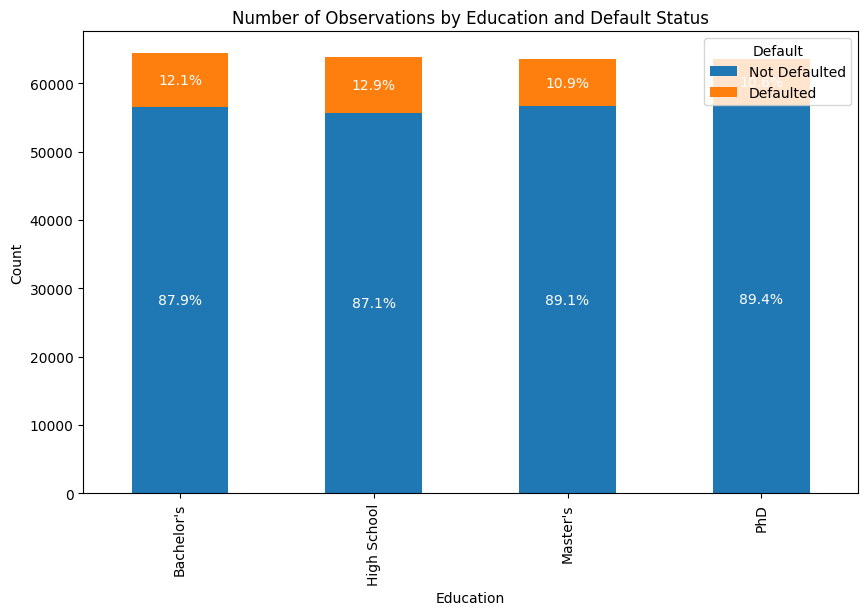

In [ ]:
counts3 = loans2.groupby(['Education', 'Default']).size().unstack(fill_value=0)
percentages3 = counts3.div(counts3.sum(axis=1), axis=0) * 100
fig, ax = plt.subplots(figsize=(10, 6))
counts3.plot(kind='bar', stacked=True, ax=ax, color=['#1f77b4', '#ff7f0e'])

for idx, (education, row) in enumerate(counts3.iterrows()):
    cumulative_count = 0
    for default_status in row.index:
        count = row[default_status]
        percentage = percentages3.loc[education, default_status]
        ax.text(idx, cumulative_count + count / 2, f'{percentage:.1f}%', ha='center', va='center', color='white', fontsize=10)
        cumulative_count += count

plt.title('Number of Observations by Education and Default Status')
plt.xlabel('Education')
plt.ylabel('Count')
plt.legend(title='Default', labels=['Not Defaulted', 'Defaulted'], loc='upper right')
plt.show()

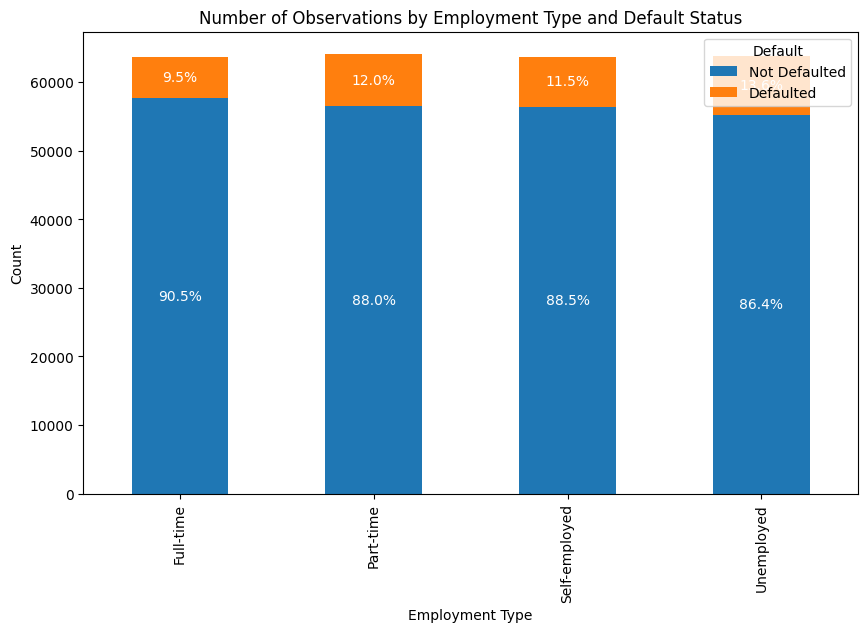

In [ ]:
counts4 = loans2.groupby(['EmploymentType', 'Default']).size().unstack(fill_value=0)
percentages4 = counts4.div(counts4.sum(axis=1), axis=0) * 100
fig, ax = plt.subplots(figsize=(10, 6))
counts4.plot(kind='bar', stacked=True, ax=ax, color=['#1f77b4', '#ff7f0e'])

for idx, (employment, row) in enumerate(counts4.iterrows()):
    cumulative_count = 0
    for default_status in row.index:
        count = row[default_status]
        percentage = percentages4.loc[employment, default_status]
        ax.text(idx, cumulative_count + count / 2, f'{percentage:.1f}%', ha='center', va='center', color='white', fontsize=10)
        cumulative_count += count

plt.title('Number of Observations by Employment Type and Default Status')
plt.xlabel('Employment Type')
plt.ylabel('Count')
plt.legend(title='Default', labels=['Not Defaulted', 'Defaulted'], loc='upper right')

plt.show()